# Ejercicio 6.4 Geodesica

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sympy as sym
import scipy as sci
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import newton
import scipy.integrate as integrate
from scipy.integrate import quad
from scipy.integrate import odeint
from matplotlib import animation
from matplotlib import rc
sym.init_printing(use_latex='mathjax')
rc("animation", html = "jshtml")

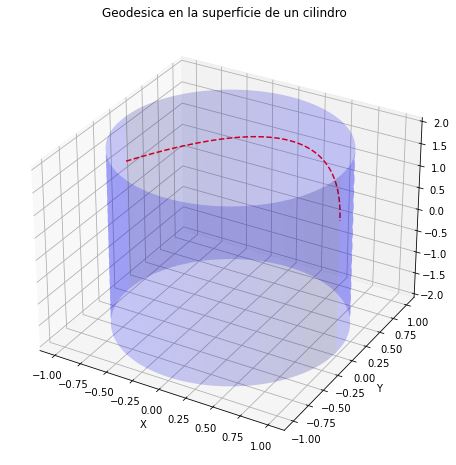

In [2]:
fig = plt.figure(figsize = (10,8))
ax = fig.add_subplot(111, projection='3d')
x=np.linspace(-1, 1, 200)
z=np.linspace(-2, 2, 200)
Xc, Zc=np.meshgrid(x, z)
Yc = np.sqrt(1-Xc**2)
xe=np.linspace(-1, 1, 200)
ze=1.0
a=1.0
b=1.0
ye=1-(xe**2/a**2)*(b**2)
ax.plot(xe, ye, ze, '--', color="r")
ax.plot_surface(Xc, Yc, Zc, alpha=0.2, rstride=15, cstride=15, color="b")
ax.plot_surface(Xc, -Yc, Zc, alpha=0.2, rstride=10, cstride=10, color="b") 
plt.xlabel('X') 
plt.ylabel('Y') 
plt.title("Geodesica en la superficie de un cilindro")
plt.show()

# Ejercicio 6.6 Braquistocrona

T(Braquistocrona) = 0.580
T(Particula) = 0.571


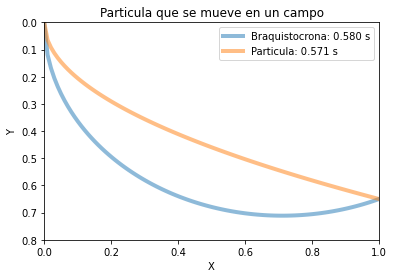

In [3]:

g = 9.81
x2, y2 = 1, 0.65
def func(x, f, fp):
    return np.sqrt((1+fp(x)**2) / (2 * g * f(x)))
def Braquistocrona(x2, y2, N=100):
    r = (x2**2 + y2**2)/2/x2
    def f(x):
        return np.sqrt(2*r*x - x**2)
    def fp(x):
        return (r-x)/f(x)
    x = np.linspace(0, x2, N)
    y = f(x)
    T = quad(func, 0, x2, args=(f, fp))[0]
    print('T(Braquistocrona) = {:.3f}'.format(T))
    return x, y, T
def Particula(x2, y2, N=100):
    c = (y2/x2)**2
    def f(x):
        return np.sqrt(c*x)
    def fp(x):
        return c/2/f(x)
    x = np.linspace(0, x2, N)
    y = f(x)
    T = quad(func, 0, x2, args=(f, fp))[0]
    print('T(Particula) = {:.3f}'.format(T))
    return x, y, T
fig, ax = plt.subplots()
for curve in ('Braquistocrona', 'Particula'):
    x, y, T = globals()[curve](x2, y2)
    ax.plot(x, y, lw=4, alpha=0.5, label='{}: {:.3f} s'.format(curve, T))
ax.legend()
plt.xlabel('X') 
plt.ylabel('Y') 
plt.title("Particula que se mueve en un campo")
ax.set_xlim(0, 1)
ax.set_ylim(0.8, 0)
plt.show()

# Ejercicio 7.2 Pendulo y tren

In [4]:
l0 = 1 # m
l1 = 1 # m
m1 = 8 # kg
m2 = 10 # kg
kr = 300 
Tiempo = 10 #s
g = 9.8 # m/s**2
th_0 = 70*np.pi/180 # ángulo inicial rad 
w_0 = 0.0 # velocidad angular inicial rad/s
x_0 = 1 # posición inicial del tren
v_0 = 0.0 # velocidad inicial del tren

In [5]:
def x_doblepunto(x, th, w, l, m1, m2, k, g): 
    part_n1 = -k*x+(m2*np.sin(th)*l*((w)**(2)))
    part_n2 = m2*(k*x-m2*np.sin(th)*l*((w)**(2))-g*(m1+m2)*np.tan(th))
    deno1 = m1+m2
    deno2 = (m1+m2)*((m1+m2)*(np.tan(th)**(2))+m2)
    return (part_n1/deno1)-(part_n2/deno2)
def theta_doblepunto(x, th, w, l, m1, m2, k, g): 
    numerador = (k*x)-(m2*np.sin(th)*l*(w)**(2))-(g*(m1+m2)*np.tan(th))
    denominador = (l*(m1+m2)*np.sin(th)*np.tan(th))+(m1*l*np.cos(th))
    return numerador/denominador
def tren_pendulo (x, theta, v, w, l, m1, m2, k): 
    x1 = x_doblepunto(x, theta, w, l, m1, m2, kr,g)
    theta = theta_doblepunto(x, theta, w, l, m1, m2, kr, g)
    acople = np.array([v, w, x1, theta])
    return acople 

In [6]:
def metodo_runge(f, h, x, theta, v, w, args): 
    k_1 = f(x, theta, v, w, *args)
    k_2 = f(x+0.5*h*k_1[0], theta+0.5*h*k_1[1], v+0.5*h*k_1[2], w+0.5*h*k_1[3], *args)
    k_3 = f(x+0.5*h*k_2[0], theta+0.5*h*k_2[1], v+0.5*h*k_2[2], w+0.5*h*k_2[3], *args)
    k_4 = f(x+h*k_3[0], theta+h*k_3[1], v+h*k_3[2], w+h*k_3[3], *args)
    v_x = np.array([x, theta, v, w])
    m = h*(k_1+2*k_2+2*k_3+k_4)/6.
    sol_nv = v_x + m
    return sol_nv
def inte_solver(time, x_0, v_0, th_0, w_0, l, m1, m2, k, step=0.007): 
    frame = int(time*200)
    args = (l, m1, m2, k)
    inte_solution = np.zeros(shape=(2, frame))
    x_array = inte_solution[0,:]
    th_array = inte_solution[1,:]
    x_array[0] = x_0
    th_array[0] = th_0
    v = v_0
    w = w_0
    for i in range(frame-1):
        z = metodo_runge(tren_pendulo, step, x_array[i], th_array[i], v, w, args=args)
        x_array[i+1] = z[0]
        th_array[i+1] = z[1]
        v = z[2]
        w = z[3]
    return inte_solution
def polares_a_catesianas(solt, ls, lp): 
    xs = ls+solt[0,:]
    xp = xs+lp*np.sin(solt[1,:])
    ys = np.zeros(len(solt[0,:]))
    yp = -lp*np.cos(solt[1,:])
    return np.array([xs, ys, xp, yp])
solution = inte_solver(Tiempo, x_0, v_0, th_0, w_0, l1, m1, m2, kr)
data = polares_a_catesianas(solution, l0, l1)

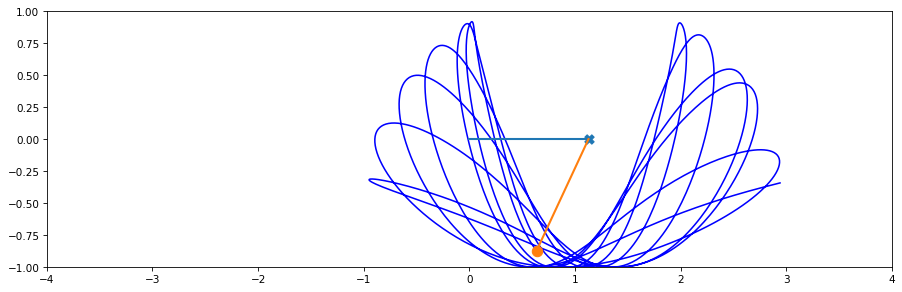

In [7]:
def init_elements(d, m1, m2, ax): 
    m_1 = ax.scatter(d[0, :1], d[1, :1] ,s=80, marker="X")
    m_2 = ax.scatter(d[2, :1], d[3, :1] ,s=80*m2/m1)
    tren, = ax.plot([0, d[0, 0]], [0, d[1, 0]], lw=2)
    pendulo, = ax.plot([d[0, 0],d[2, 0]],[d[1, 0],d[3, 0]],lw=2)
    t, = ax.plot(d[2, :1], d[3, :1],c='b',zorder=-1)
    return m_1, m_2, tren, pendulo, t
def update(num_frame,d,elements,paso): 
    j = num_frame * paso
    m_1, m_2,tren, pendulo, t = elements
    t.set_data(d[2:4, :j+1])
    m_1.set_offsets(d[0:2, j:j+1].T)
    m_2.set_offsets(d[2:4, j:j+1].T)
    tren.set_data([0, d[0, j]], [0, d[1, j]])
    pendulo.set_data([d[0, j], d[2, j]], [d[1, j], d[3, j]])
def fit_axes(l0,l1): 
    fig = plt.figure(figsize = (12,4), dpi = 75)
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1) 
    ax = fig.gca()
    plt.tight_layout()
    plt.xlim([(-l0 - l1)*2, (l0 + l1)*2])
    plt.ylim([-l1, l1])
    return fig, ax
def create_anim(data, l0, l1, m1, m2, time, fps, name): 
    N = time*fps
    paso = int(np.floor(data.shape[1] / N))
    if paso<1: raise ValueError('Escoje puntos > '+ str(N))
    fig, ax = fit_axes(l0,l1)
    elements = init_elements(data,m1,m2,ax)
    ani = animation.FuncAnimation(fig,update,N,fargs=(data,elements,paso))
    return ani
fps = 24 # fotogramas por segundo
create_anim(data, l0, l1, m1, m2, Tiempo, fps ,'pendulo.gif')

Observamos que el movimiento del pendulo no depende de la aceleracion que lleve el tren representada en la grafica con el vector verde. Postulamos ahora una forma que relacione la frecuencia

In [8]:
a=np.random.rand(1,10)
g=9.8
l=2.0
for i in a:
    w=np.sqrt(np.sqrt(i**2+g**2)/l)
    print ("las posibles bajo las condiciones impuestas frecuencia son: ")
    print(w)


las posibles bajo las condiciones impuestas frecuencia son: 
[2.21480297 2.21539675 2.21366677 2.21386704 2.21844556 2.21477402
 2.21392419 2.21413151 2.21423055 2.21772262]


# Ejercicio 7.3 Esfera sobre la mitad de un cilindro - Prueba numerica

In [9]:
g=9.8
r=np.random.rand(1,5)
R=10
w=np.sqrt((5*g)/7*(R-r))
print ("Posibles frecuencias para angulos pequeños: ")
print (w)


Posibles frecuencias para angulos pequeños: 
[[8.13768714 8.0798629  8.00048336 8.01960456 8.27016267]]


# Ejercicio 7.17 Masa deslizando sobre plano, cuya distancia al origen rota


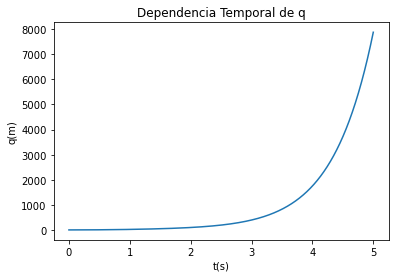

In [10]:
g=9.81
w=1.5
t=np.linspace(0,5,10000)
q=(2*g/w**2)*(np.cosh(w*t)-np.cos(w*t))
plt.plot(t,q)
plt.title("Dependencia Temporal de q")
plt.xlabel("t(s)")
plt.ylabel("q(m)")
plt.show()

In [26]:
#Resolver la ecuación diferencial de forma computacional.
import sympy as sym
t=sym.Symbol("t")
w=sym.Symbol("w")
m=sym.Symbol("m")
g=sym.Symbol("g")
q=sym.Function("q")
ed=sym.Eq(q(t).diff(t,2)-w**2*q(t)-m*g*sym.cos(w*t),0)
CI={q(0):0, q(t).diff().subs(t,0):0}
sym.dsolve(ed,q(t),ics=CI)

            t⋅w                       -t⋅w
       g⋅m⋅ℯ      g⋅m⋅cos(t⋅w)   g⋅m⋅ℯ    
q(t) = ──────── - ──────────── + ─────────
            2            2             2  
         4⋅w          2⋅w           4⋅w   

Sustituyendo las exponenciales por coseno hiperbólico llegamos a la respuesta que pide el libro.